# Predicting Vehicle Prices Using Regression Models

## **Objectives**  
The primary goal of this project is to develop a robust regression model to predict used car prices for a reseller based on various listed features and specifications. In addition to predicting prices, the project focuses on identifying feature importance and mitigating overfitting through the application of regularisation techniques.

There can be several business objectives for this, such as:

* **Price Prediction**: Model car prices based on features like mileage, fuel type, and performance.
* **Market Analysis**: Explore trends and preferences in the used car market, by type, region, or other metrics.
* **Feature Importance**: Identify the most important factors influencing car prices (e.g., fuel type, mileage, age).

### **Tasks Overview**
The data pipeline for this task involves the following steps:  
1. **Dataset Overview**   
2. **Data Preprocessing**
3. **Data Visualisation & Exploration**
4. **Model Building**
3. **Regularisation**

## **1 Data Understanding**

| **Variable** | **Description** |
--------|--------------|
| `make_model` | The brand and model of the vehicle (e.g., 'Audi A1'). |
| `body_type` | The body style of the vehicle, such as Sedan, Compact, or Station Wagon. |
| `price`  | The listed price of the car in currency. |
| `vat`  | Indicates the VAT status for the vehicle's price (e.g., VAT deductible, Price negotiable). |
| `km` | The total mileage (in kilometers) of the vehicle, indicating its usage. |
| `Type` | Condition of the vehicle, whether it's 'Used' or 'New'.|
| `Fuel` | Type of fuel the vehicle uses, such as 'Diesel', 'Benzine', etc. |
| `Gears` | The number of gears in the vehicle's transmission. |
| `Comfort_Convenience` | Comfort and convenience features, such as 'Air conditioning', 'Leather steering wheel', 'Cruise control', and more. |
| `Entertainment_Media` | Media features available in the vehicle, including 'Bluetooth', 'MP3', 'Radio', etc. |
| `Extras` | Additional features like 'Alloy wheels', 'Sport suspension', etc.|
| `Safety_Security` | Safety features like 'ABS', 'Airbags', 'Electronic stability control', 'Isofix', etc.  |
| `age` | Age of the car (calculated based on the model year). |
| `Previous_Owners`| The number of previous owners the car has had. |
| `hp_kW` | Engine power in kilowatts (kW), indicating the performance capacity of the engine.|
| `Inspection_new` | Indicates whether the car has recently undergone an inspection (1 for yes, 0 for no). |
| `Paint_Type`| The type of paint on the car, such as 'Metallic', 'Matte', etc. |
| `Upholstery_type` | The material used for the interior upholstery, such as 'Cloth', 'Leather', etc.|
| `Gearing_Type` | The type of transmission the car uses, either 'Automatic' or 'Manual'. |
| `Displacement_cc` | The engine displacement in cubic centimeters (cc), indicating the size of the engine.|
| `Weight_kg` | The total weight of the vehicle in kilograms.|
| `Drive_chain` | The type of drivetrain, indicating whether it's 'Front' or 'Rear' wheel drive. |
| `cons_comb`  | The combined fuel consumption in liters per 100 kilometers.|

### **1.1 Data Loading**

**Importing Necessary Libraries**

In [3]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt



#### **1.1.1**
Load the dataset

In [5]:
# Load the data
data=pd.read_csv("Car_Price_data.csv")
data.head()


,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,...,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
0,Audi A1,Sedans,15770,VAT deductible,56013.0,Used,Diesel,7.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...",...,2.0,66.0,1,Metallic,Cloth,Automatic,1422.0,1220.0,front,3.8
1,Audi A1,Sedans,14500,Price negotiable,80000.0,Used,Benzine,7.0,"Air conditioning,Automatic climate control,Hil...","Bluetooth,Hands-free equipment,On-board comput...",...,1.0,141.0,0,Metallic,Cloth,Automatic,1798.0,1255.0,front,5.6
2,Audi A1,Sedans,14640,VAT deductible,83450.0,Used,Diesel,7.0,"Air conditioning,Cruise control,Electrical sid...","MP3,On-board computer",...,1.0,85.0,0,Metallic,Cloth,Automatic,1598.0,1135.0,front,3.8
3,Audi A1,Sedans,14500,VAT deductible,73000.0,Used,Diesel,6.0,"Air suspension,Armrest,Auxiliary heating,Elect...","Bluetooth,CD player,Hands-free equipment,MP3,O...",...,1.0,66.0,0,Metallic,Cloth,Automatic,1422.0,1195.0,front,3.8
4,Audi A1,Sedans,16790,VAT deductible,16200.0,Used,Diesel,7.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...",...,1.0,66.0,1,Metallic,Cloth,Automatic,1422.0,1135.0,front,4.1


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15915 entries, 0 to 15914
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   make_model           15915 non-null  object 
 1   body_type            15915 non-null  object 
 2   price                15915 non-null  int64  
 3   vat                  15915 non-null  object 
 4   km                   15915 non-null  float64
 5   Type                 15915 non-null  object 
 6   Fuel                 15915 non-null  object 
 7   Gears                15915 non-null  float64
 8   Comfort_Convenience  15915 non-null  object 
 9   Entertainment_Media  15915 non-null  object 
 10  Extras               15915 non-null  object 
 11  Safety_Security      15915 non-null  object 
 12  age                  15915 non-null  float64
 13  Previous_Owners      15915 non-null  float64
 14  hp_kW                15915 non-null  float64
 15  Inspection_new       15915 non-null 

## **2 Analysis and Feature Engineering** <font color =red> [35 marks] </font>



### **2.1 Preliminary Analysis and Frequency Distributions** <font color = red> [13 marks] </font>

#### **2.1.1** <font color =red> [1 marks] </font>
Check and fix missing values.

In [9]:
# Find the proportion of missing values in each column and handle if found
for col in data.columns:
    print(col)
    print(data[col].isnull().sum())
    print(".................")

make_model
0
.................
body_type
0
.................
price
0
.................
vat
0
.................
km
0
.................
Type
0
.................
Fuel
0
.................
Gears
0
.................
Comfort_Convenience
0
.................
Entertainment_Media
0
.................
Extras
0
.................
Safety_Security
0
.................
age
0
.................
Previous_Owners
0
.................
hp_kW
0
.................
Inspection_new
0
.................
Paint_Type
0
.................
Upholstery_type
0
.................
Gearing_Type
0
.................
Displacement_cc
0
.................
Weight_kg
0
.................
Drive_chain
0
.................
cons_comb
0
.................


**From the features, identify the target feature and numerical and categorical predictors. Select the numerical and categorical features carefully as they will be used in analysis.**

#### **2.1.2** <font color =red> [3 marks] </font>
Identify numerical predictors and plot their frequency distributions.

In [11]:
# Identify numerical features and plot histograms

numerical_cols=[]
for col in data.columns:
    if data[col].dtype!="object":
        numerical_cols.append(col)
print(f"numerical columns are \n { numerical_cols}")

numerical columns are 
 ['price', 'km', 'Gears', 'age', 'Previous_Owners', 'hp_kW', 'Inspection_new', 'Displacement_cc', 'Weight_kg', 'cons_comb']


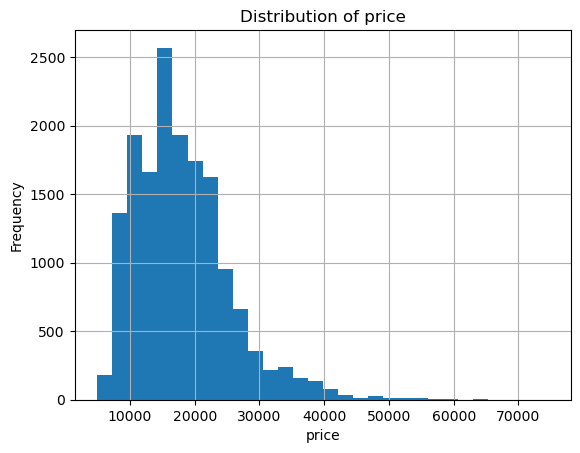

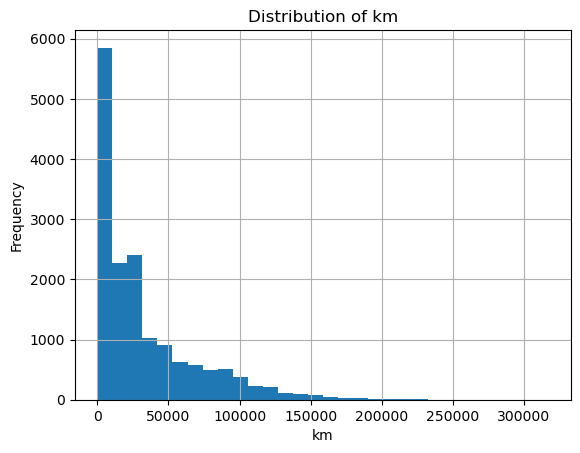

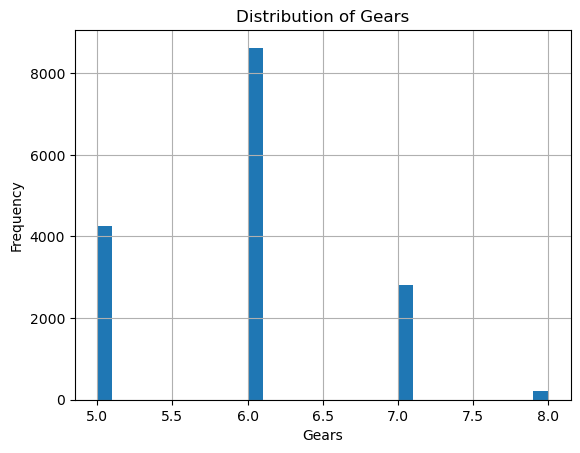

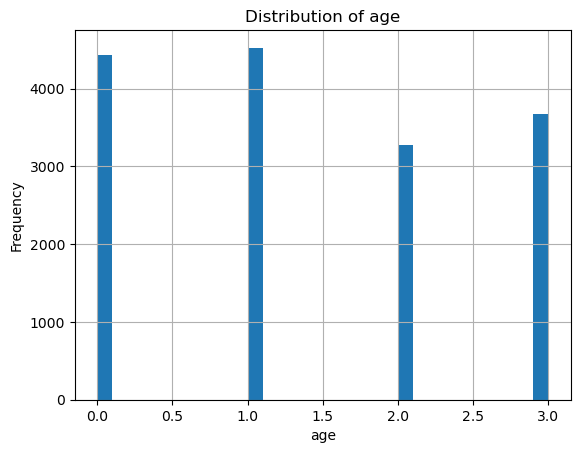

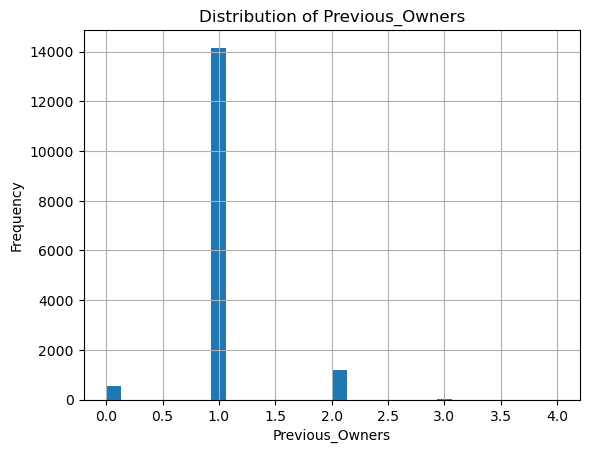

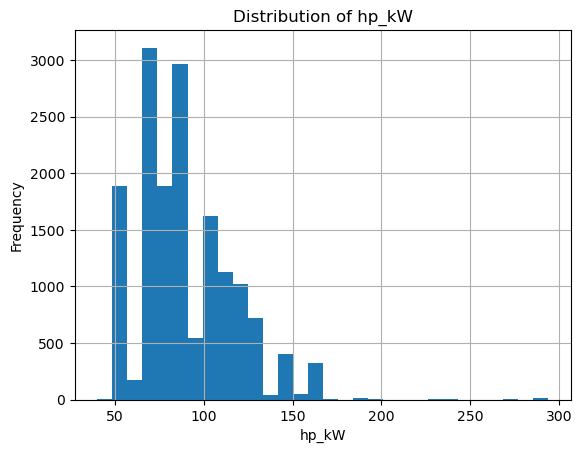

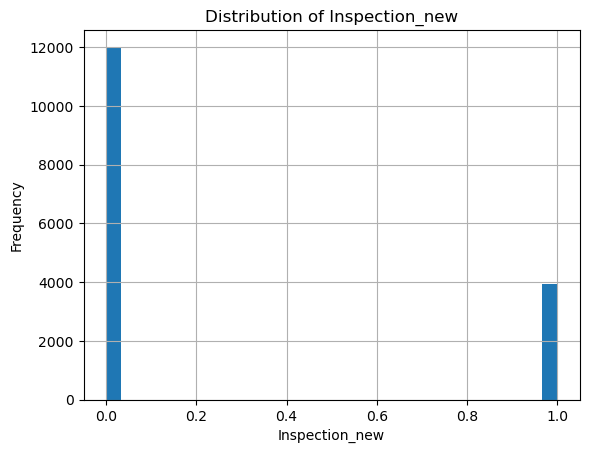

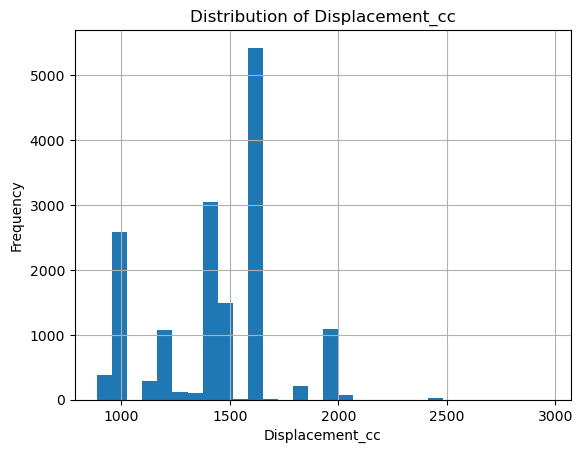

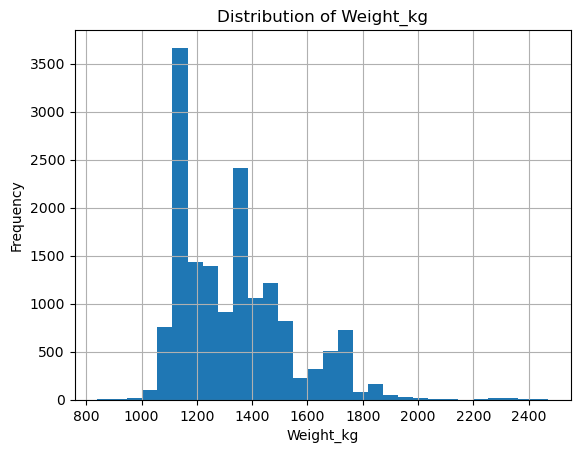

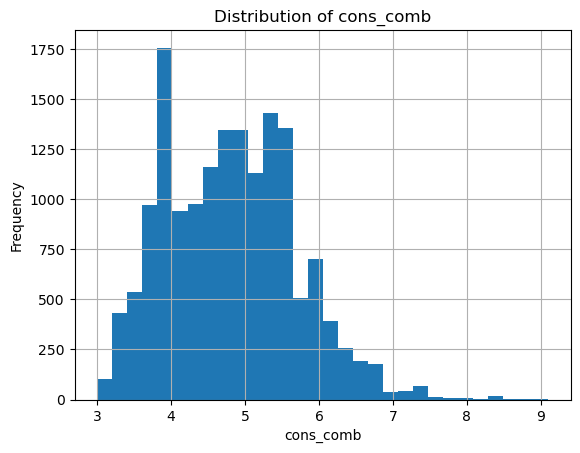

In [13]:
#frequecy distributions

for col in numerical_cols:
    plt.figure()
    data[col].hist(bins=30)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

In [53]:
data[numerical_cols].describe()

,price,km,Gears,age,Previous_Owners,hp_kW,Inspection_new,Displacement_cc,Weight_kg,cons_comb
count,15915.000000,15915.000000,15915.000000,15915.000000,15915.000000,15915.000000,15915.000000,15915.000000,15915.000000,15915.000000
mean,18024.380584,32089.995708,5.937355,1.389695,1.042853,88.499340,0.247063,1428.661891,1337.700534,4.832124
std,7381.679318,36977.214964,0.704772,1.121306,0.339178,26.674341,0.431317,275.804272,199.682385,0.867530
min,4950.000000,0.000000,5.000000,0.000000,0.000000,40.000000,0.000000,890.000000,840.000000,3.000000
25%,12850.000000,1920.500000,5.000000,0.000000,1.000000,66.000000,0.000000,1229.000000,1165.000000,4.100000
50%,16900.000000,20413.000000,6.000000,1.000000,1.000000,85.000000,0.000000,1461.000000,1295.000000,4.800000
75%,21900.000000,46900.000000,6.000000,2.000000,1.000000,103.000000,0.000000,1598.000000,1472.000000,5.400000
max,74600.000000,317000.000000,8.000000,3.000000,4.000000,294.000000,1.000000,2967.000000,2471.000000,9.100000


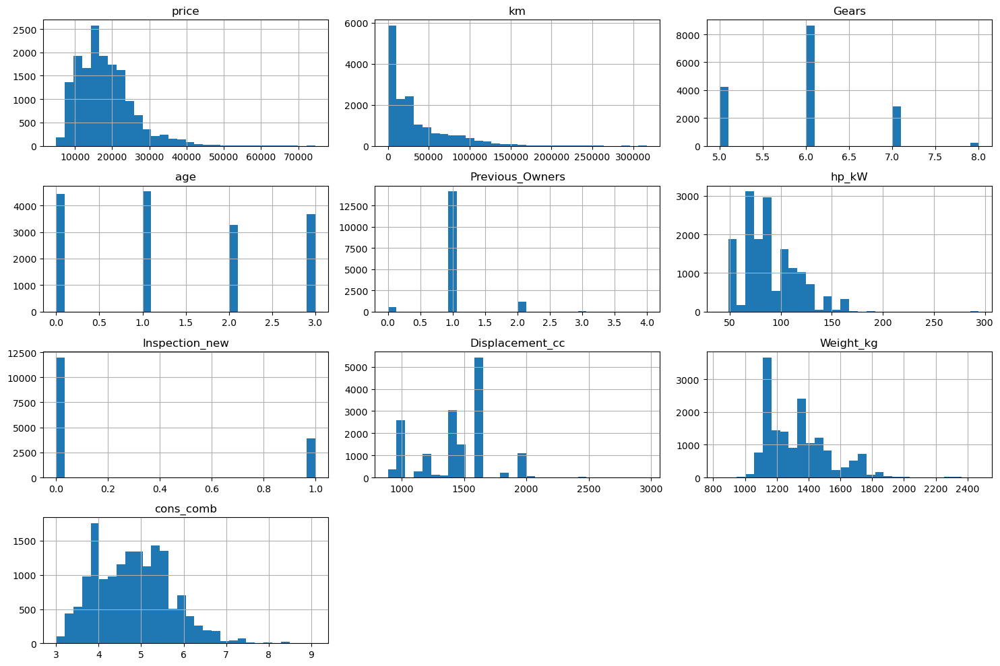

In [15]:
data[numerical_cols].hist(figsize=(15,10), bins=30)
plt.tight_layout()
plt.show()

#### **2.1.3** <font color =red> [3 marks] </font>
Identify categorical predictors and plot their frequency distributions.

In [17]:
cat_cols = data.select_dtypes(include=['object']).columns

print("Categorical Columns:")
print(cat_cols)

Categorical Columns:
Index(['make_model', 'body_type', 'vat', 'Type', 'Fuel', 'Comfort_Convenience',
       'Entertainment_Media', 'Extras', 'Safety_Security', 'Paint_Type',
       'Upholstery_type', 'Gearing_Type', 'Drive_chain'],
      dtype='object')


In [19]:
# Identify categorical columns and check their frequency distributions
for col in cat_cols:
    print(f"\nFrequency distribution for {col}:")
    print(data[col].value_counts())



Frequency distribution for make_model:
make_model
Audi A3           3097
Audi A1           2614
Opel Insignia     2598
Opel Astra        2525
Opel Corsa        2216
Renault Clio      1839
Renault Espace     991
Renault Duster      34
Audi A2              1
Name: count, dtype: int64

Frequency distribution for body_type:
body_type
Sedans           8004
Station wagon    3677
Compact          3240
Van               817
Transporter        88
Off-Road           56
Coupe              25
Convertible         8
Name: count, dtype: int64

Frequency distribution for vat:
vat
VAT deductible      15044
Price negotiable      871
Name: count, dtype: int64

Frequency distribution for Type:
Type
Used              11095
New                1649
Pre-registered     1364
Employee's car     1011
Demonstration       796
Name: count, dtype: int64

Frequency distribution for Fuel:
Fuel
Benzine     8548
Diesel      7298
LPG/CNG       64
Electric       5
Name: count, dtype: int64

Frequency distribution for Comf

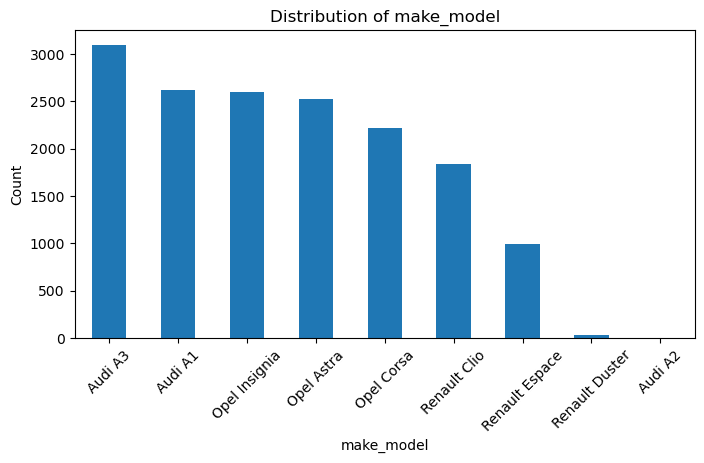

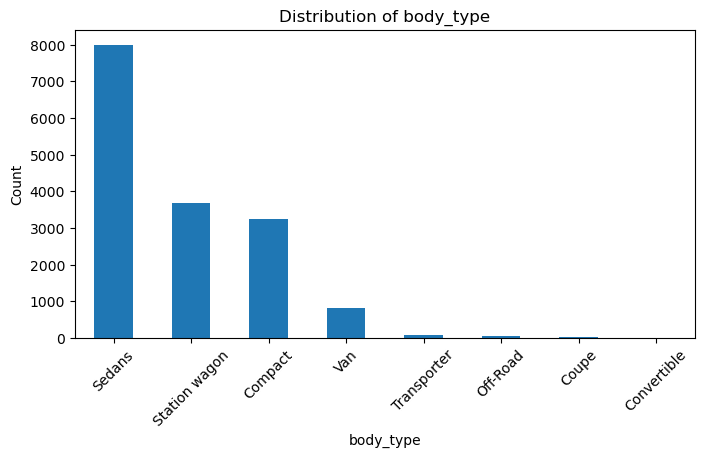

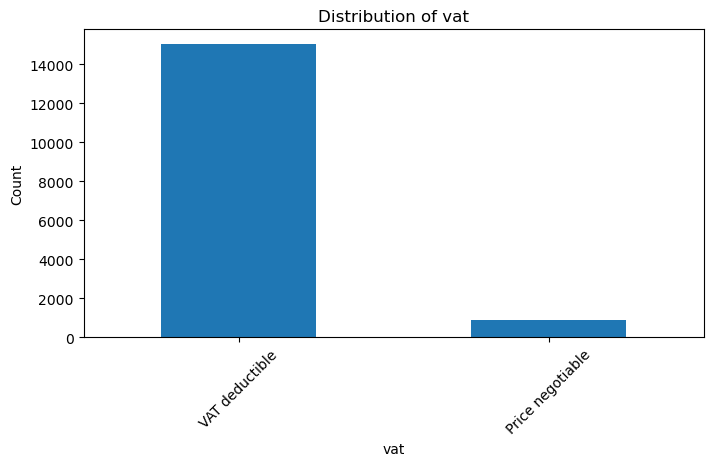

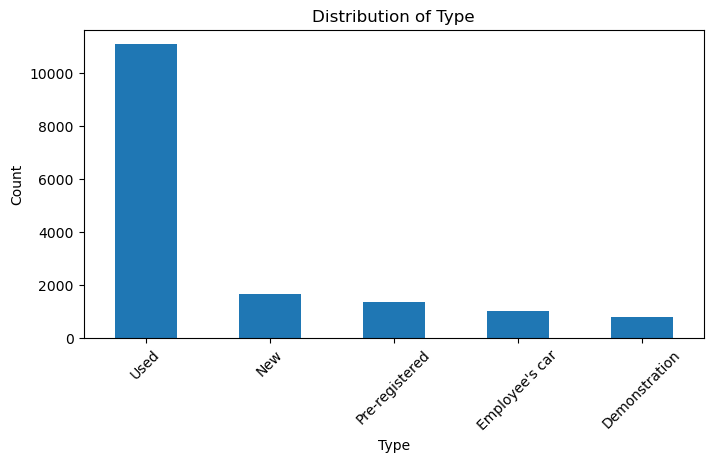

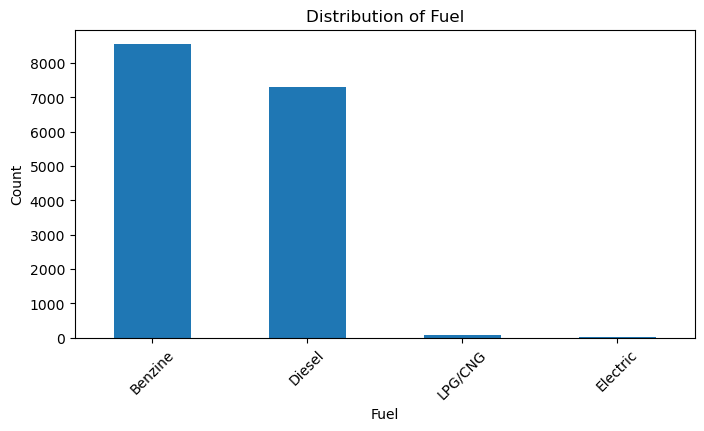

...

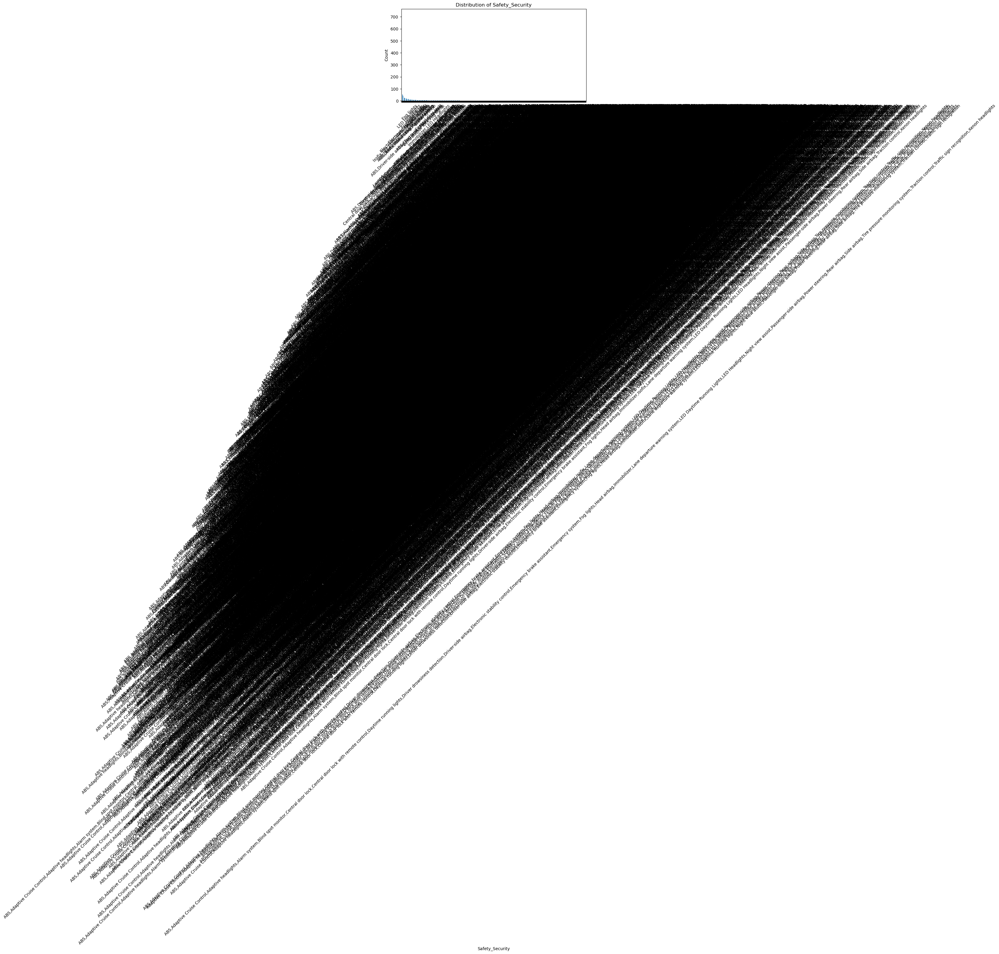

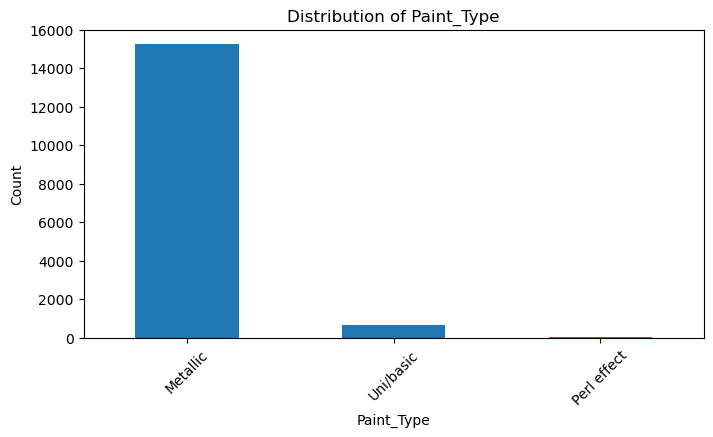

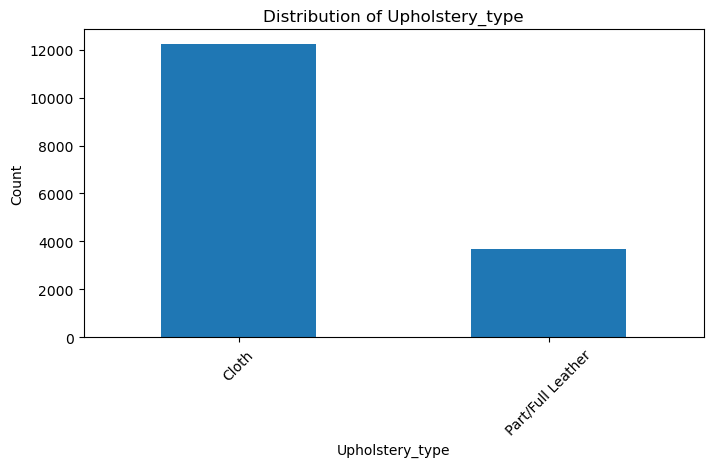

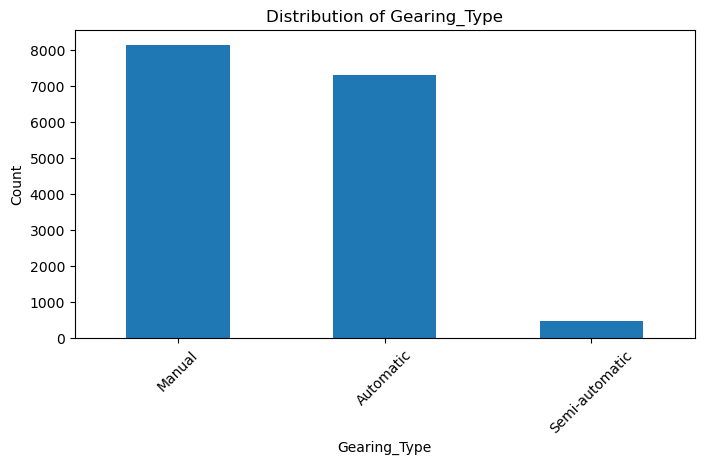

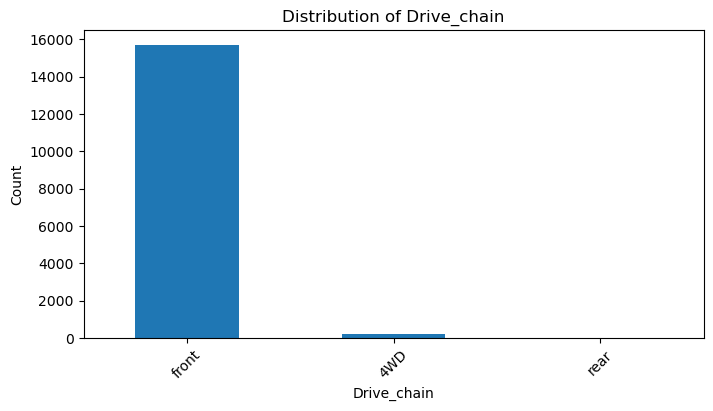

In [65]:
import matplotlib.pyplot as plt

for col in cat_cols:
    plt.figure(figsize=(8,4))
    data[col].value_counts().plot(kind='bar')
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.show()

In [21]:
data['num_extras'] = data['Extras'].apply(lambda x: len(str(x).split(',')))
data['num_safety'] = data['Safety_Security'].apply(lambda x: len(str(x).split(',')))

In [23]:
#categorical columns  ["Comfort_Convenience", "Entertainment_Media", "Extras", "Safety_Security"]. should  not be considered as categorical because
#of too many  unique features so we can extract features count as this is regression model

data['num_comfort'] = data['Comfort_Convenience'].apply(lambda x: len(str(x).split(',')))
data['num_media'] = data['Entertainment_Media'].apply(lambda x: len(str(x).split(',')))


**Note**: Look carefully at the values stored in columns `["Comfort_Convenience", "Entertainment_Media", "Extras", "Safety_Security"]`.

Should they be considered categorical? Should they be dropped or handled any other way?

#### **2.1.4** <font color =red> [3 marks] </font>
Fix columns with low frequency values and class imbalances.

Some information regarding values in the `Type` column that may help:
- *'Pre-registered'* cars are ones which have already been registered previously by the seller.
- *'New'* cars are not necessarily new cars, but new-like cars. These might also have multiple owners due to multiple pre-registrations as well.
- *'Employee's car'* are cars used by employees over a short period of time and small distance.
- *'Demonstration'* cars are used for trial purposes and also driven for a short time and distance.

Based on these, you can handle this particular column. For other columns, decide a strategy on your own.

In [25]:
data = data.drop([
    'Comfort_Convenience',
    'Entertainment_Media',
    'Extras',
    'Safety_Security'
], axis=1)

In [27]:
data.head()

,make_model,body_type,price,vat,km,Type,Fuel,Gears,age,Previous_Owners,...,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb,num_extras,num_safety,num_comfort,num_media
0,Audi A1,Sedans,15770,VAT deductible,56013.0,Used,Diesel,7.0,3.0,2.0,...,Cloth,Automatic,1422.0,1220.0,front,3.8,3,14,16,4
1,Audi A1,Sedans,14500,Price negotiable,80000.0,Used,Benzine,7.0,2.0,1.0,...,Cloth,Automatic,1798.0,1255.0,front,5.6,4,15,9,5
2,Audi A1,Sedans,14640,VAT deductible,83450.0,Used,Diesel,7.0,3.0,1.0,...,Cloth,Automatic,1598.0,1135.0,front,3.8,2,12,13,2
3,Audi A1,Sedans,14500,VAT deductible,73000.0,Used,Diesel,6.0,3.0,1.0,...,Cloth,Automatic,1422.0,1195.0,front,3.8,3,14,16,8
4,Audi A1,Sedans,16790,VAT deductible,16200.0,Used,Diesel,7.0,3.0,1.0,...,Cloth,Automatic,1422.0,1135.0,front,4.1,4,13,13,7


In [29]:
data["Type"].unique()

array(['Used', "Employee's car", 'New', 'Demonstration', 'Pre-registered'],
      dtype=object)

In [31]:
# Fix columns as needed
data['Type'] = data['Type'].replace({
    'Pre-registered': 'Almost New',
    'New': 'Almost New',
    "Employee's car": 'Almost New',
    'Demonstration': 'Almost New'
})
#grouped used and Almost new 



In [33]:
data["Type"]

0              Used
1              Used
2              Used
3              Used
4              Used
            ...    
15910    Almost New
15911          Used
15912    Almost New
15913    Almost New
15914    Almost New
Name: Type, Length: 15915, dtype: object

In [35]:
#fuel column major are dieseland benzene

data['Fuel'] = data['Fuel'].replace({
    'LPG/CNG': 'Other',
    'Electric': 'Other'
})

In [37]:
#body type imbalance

rare_body = ['Coupe', 'Convertible', 'Off-Road', 'Transporter']

data['body_type'] = data['body_type'].replace(rare_body, 'Other')

In [39]:
data['Drive_chain'] = data['Drive_chain'].replace({
    '4WD': 'Other',
    'rear': 'Other'
})

In [41]:
data['Paint_Type'] = data['Paint_Type'].replace({
    'Perl effect': 'Other'
})

In [43]:
data["make_model"]

0               Audi A1
1               Audi A1
2               Audi A1
3               Audi A1
4               Audi A1
              ...      
15910    Renault Espace
15911    Renault Espace
15912    Renault Espace
15913    Renault Espace
15914    Renault Espace
Name: make_model, Length: 15915, dtype: object

In [47]:
data['brand'] = data['make_model'].apply(lambda x: x.split()[0])

In [49]:
data = data.drop('make_model', axis=1)

In [51]:
data.head()

,body_type,price,vat,km,Type,Fuel,Gears,age,Previous_Owners,hp_kW,...,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb,num_extras,num_safety,num_comfort,num_media,brand
0,Sedans,15770,VAT deductible,56013.0,Used,Diesel,7.0,3.0,2.0,66.0,...,Automatic,1422.0,1220.0,front,3.8,3,14,16,4,Audi
1,Sedans,14500,Price negotiable,80000.0,Used,Benzine,7.0,2.0,1.0,141.0,...,Automatic,1798.0,1255.0,front,5.6,4,15,9,5,Audi
2,Sedans,14640,VAT deductible,83450.0,Used,Diesel,7.0,3.0,1.0,85.0,...,Automatic,1598.0,1135.0,front,3.8,2,12,13,2,Audi
3,Sedans,14500,VAT deductible,73000.0,Used,Diesel,6.0,3.0,1.0,66.0,...,Automatic,1422.0,1195.0,front,3.8,3,14,16,8,Audi
4,Sedans,16790,VAT deductible,16200.0,Used,Diesel,7.0,3.0,1.0,66.0,...,Automatic,1422.0,1135.0,front,4.1,4,13,13,7,Audi


#### **2.1.5** <font color =red> [3 marks] </font>
Identify target variable and plot the frequency distributions. Apply necessary transformations.

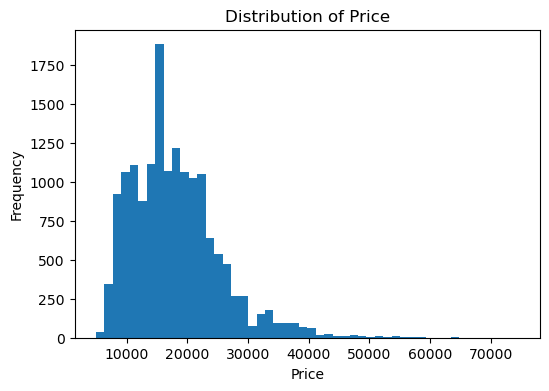

In [53]:
# Plot histograms for target feature
y=data["price"]
plt.figure(figsize=(6,4))
plt.hist(data['price'], bins=50)
plt.title("Distribution of Price")
plt.xlabel("Price")
plt.ylabel("Frequency")
plt.show()
#it is right skewed


In [55]:
data['price_log'] = np.log1p(data['price'])

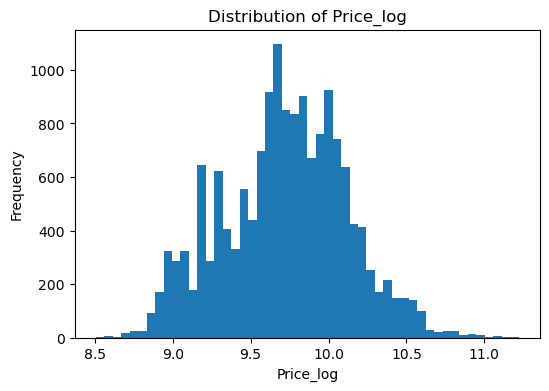

In [57]:
plt.figure(figsize=(6,4))
plt.hist(data['price_log'], bins=50)
plt.title("Distribution of Price_log")
plt.xlabel("Price_log")
plt.ylabel("Frequency")
plt.show()

**The target variable seems to be skewed. Perform suitable transformation on the target.**

In [59]:
# Transform the target feature
data["price_log"]


0         9.665928
1         9.581973
2         9.591581
3         9.581973
4         9.728598
           ...    
15910    10.595409
15911    10.593781
15912    10.593530
15913    10.589132
15914    10.621327
Name: price_log, Length: 15915, dtype: float64

### **2.2 Correlation analysis** <font color = red> [6 marks] </font>

#### **2.2.1** <font color =red> [3 marks] </font>
Plot the correlation map between features and target variable.

In [61]:
# Visualise correlation
num_df = data.select_dtypes(include=['int64', 'float64'])

corr_matrix = num_df.corr()

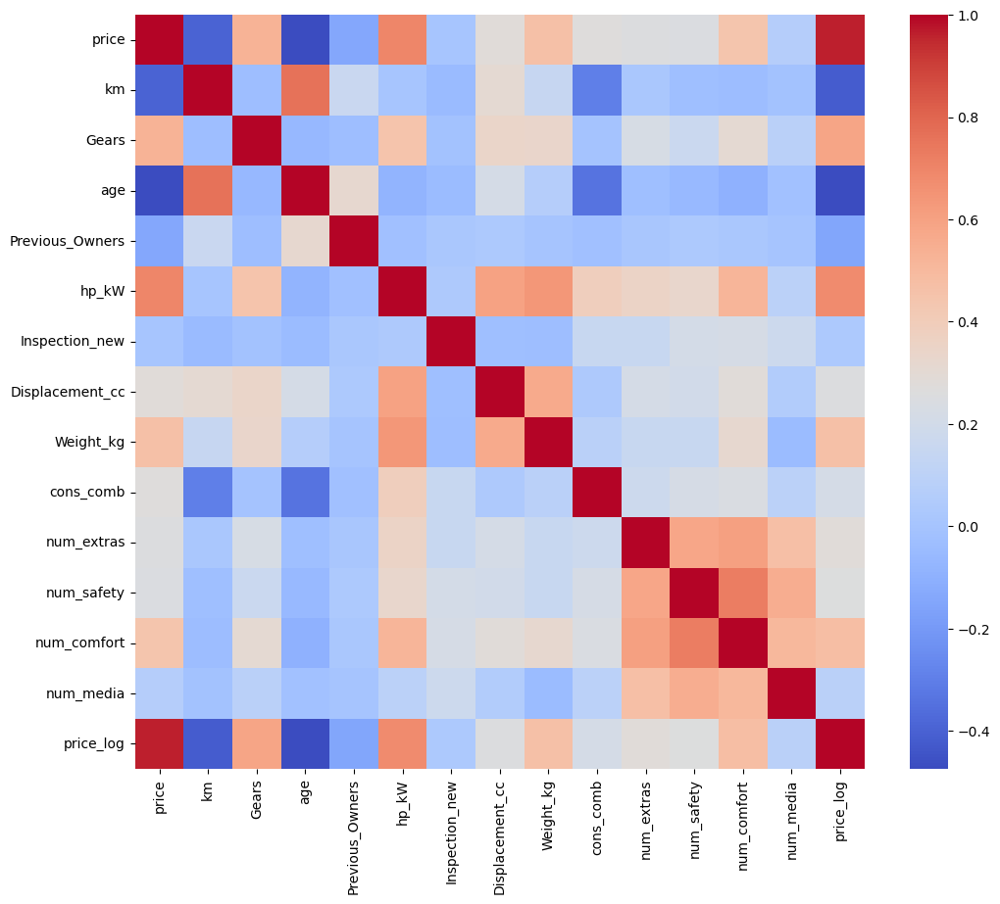

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,10))
sns.heatmap(corr_matrix, cmap='coolwarm')
plt.show()

#### **2.2.2** <font color =red> [3 marks] </font>
Analyse correlation between categorical features and target variable.

In [ ]:
# Comparing average values of target for different categories



### **2.3 Outlier analysis** <font color = red> [5 marks] </font>

#### **2.3.1** <font color =red> [2 marks] </font>
Identify potential outliers in the data.

In [67]:
# Outliers present in each column
cat_cols = data.select_dtypes(include=['object']).columns

for col in cat_cols:
    print(f"\nAverage price_log for {col}:")
    print(data.groupby(col)['price_log'].mean().sort_values(ascending=False))



Average price_log for body_type:
body_type
Van              10.294540
Station wagon     9.753456
Sedans            9.716144
Other             9.622932
Compact           9.555735
Name: price_log, dtype: float64

Average price_log for vat:
vat
VAT deductible      9.730286
Price negotiable    9.556299
Name: price_log, dtype: float64

Average price_log for Type:
Type
Almost New    9.928387
Used          9.630566
Name: price_log, dtype: float64

Average price_log for Fuel:
Fuel
Diesel     9.734926
Benzine    9.709328
Other      9.639463
Name: price_log, dtype: float64

Average price_log for Paint_Type:
Paint_Type
Metallic     9.725404
Uni/basic    9.638642
Other        9.144565
Name: price_log, dtype: float64

Average price_log for Upholstery_type:
Upholstery_type
Part/Full Leather    9.981383
Cloth                9.642348
Name: price_log, dtype: float64

Average price_log for Gearing_Type:
Gearing_Type
Semi-automatic    9.972004
Automatic         9.906177
Manual            9.540276
Name: 

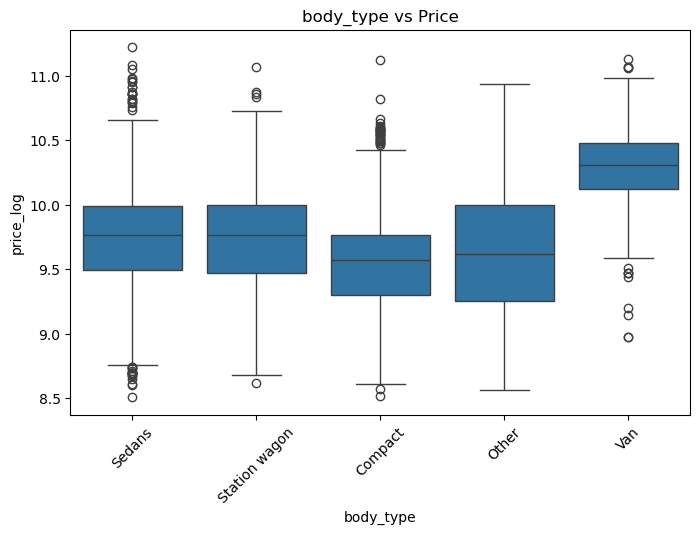

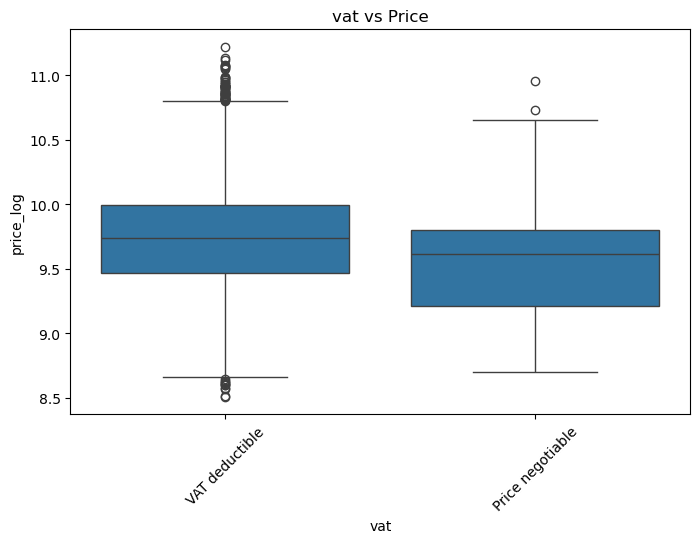

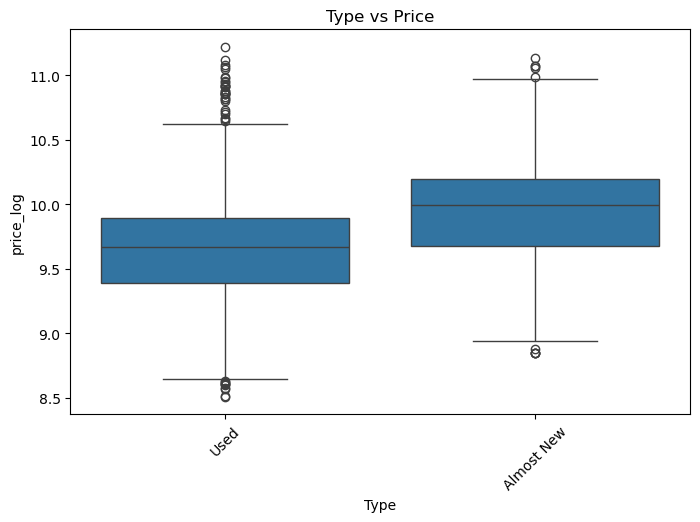

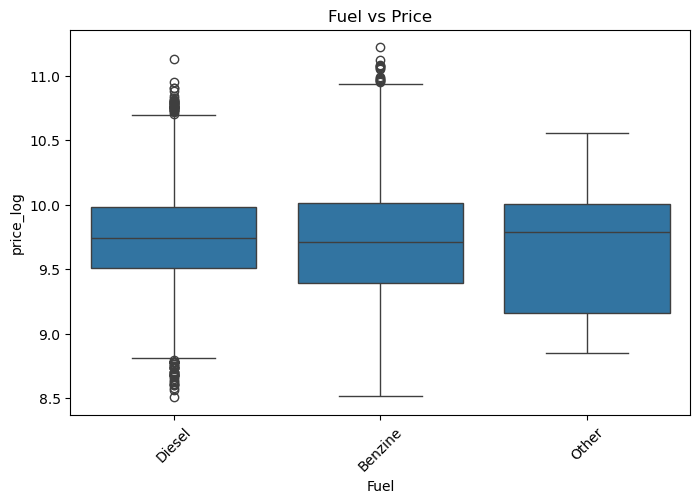

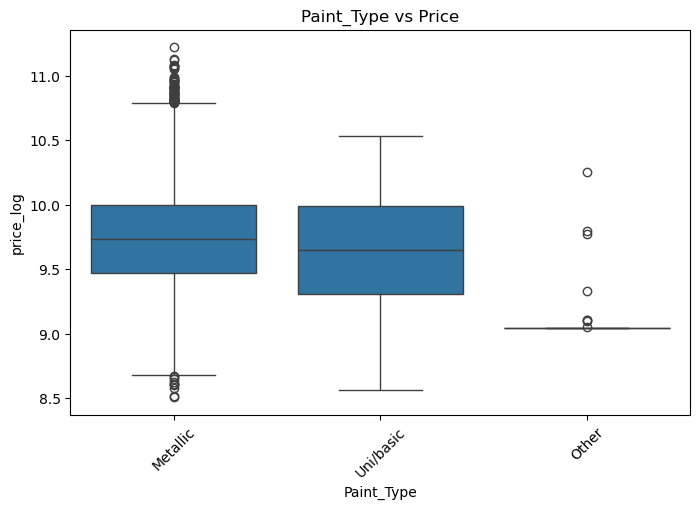

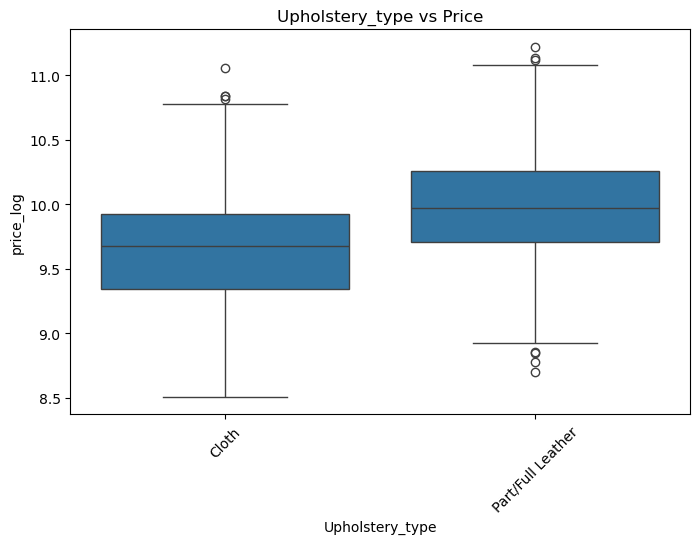

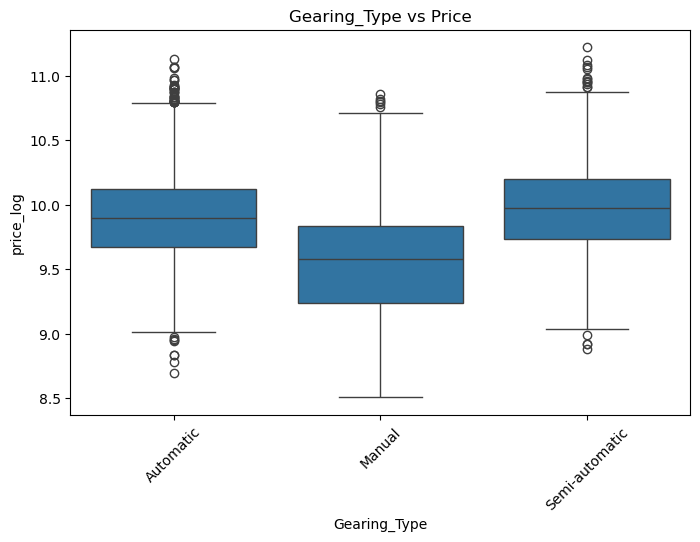

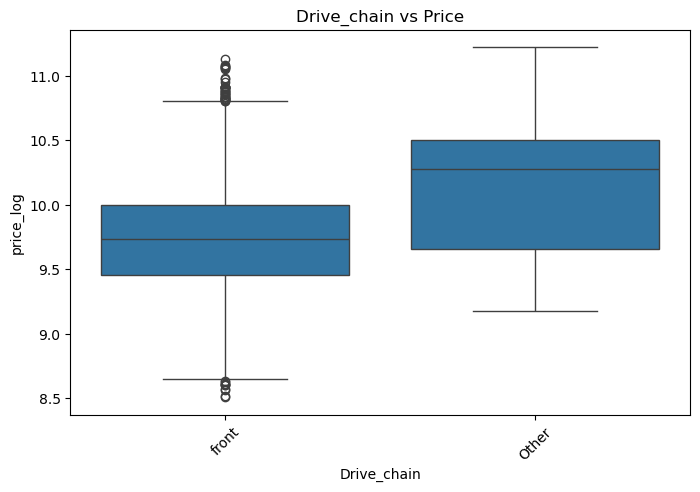

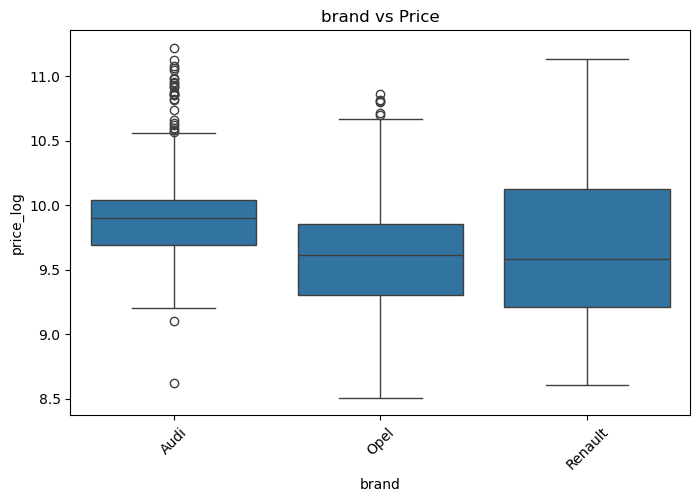

In [69]:
for col in cat_cols:
    plt.figure(figsize=(8,5))
    sns.boxplot(x=col, y='price_log', data=data)
    plt.xticks(rotation=45)
    plt.title(f"{col} vs Price")
    plt.show()

#### **2.3.2** <font color =red> [3 marks] </font>
Handle the outliers suitably.

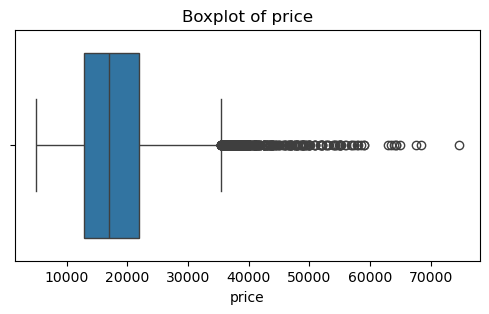

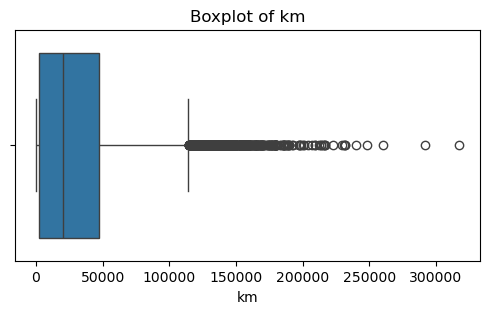

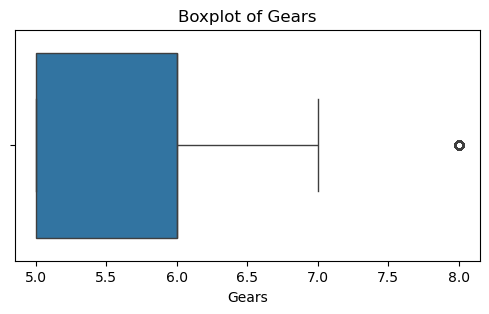

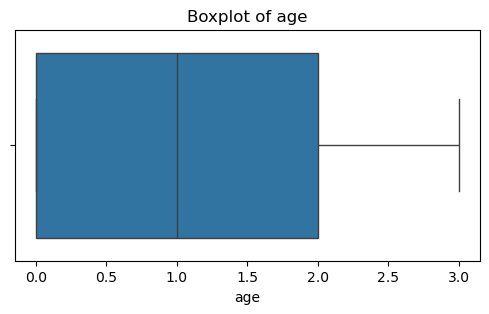

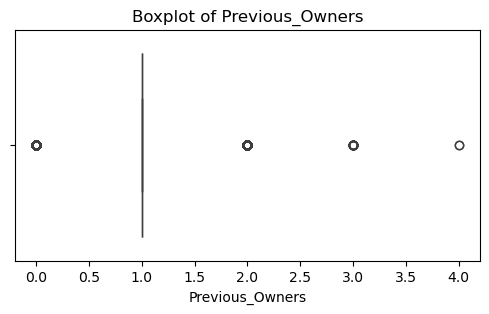

...

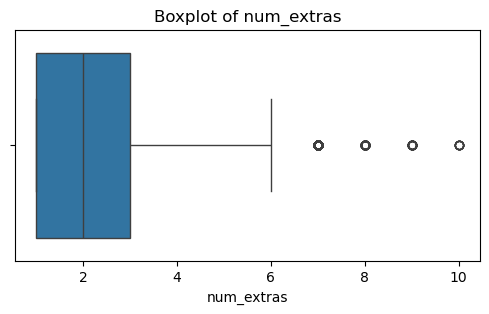

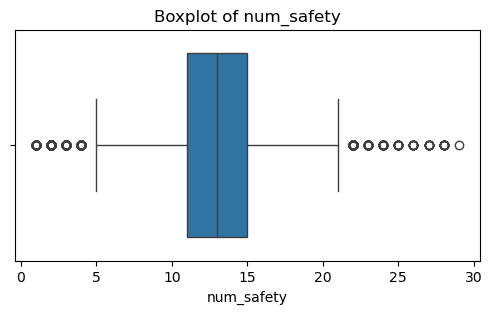

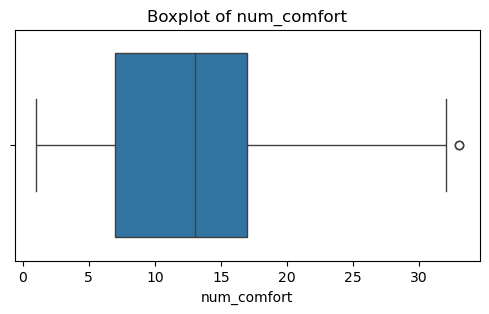

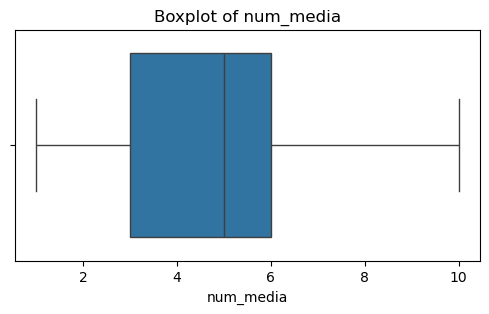

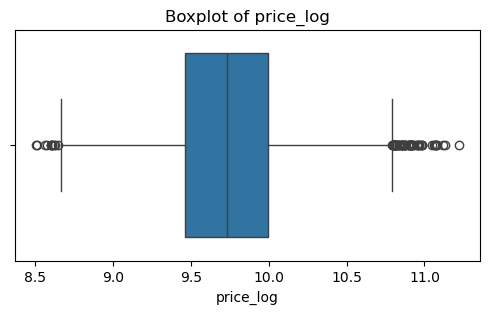

In [71]:
# Handle outliers
num_cols = data.select_dtypes(include=['int64', 'float64']).columns

for col in num_cols:
    plt.figure(figsize=(6,3))
    sns.boxplot(x=data[col])
    plt.title(f"Boxplot of {col}")
    plt.show()

In [73]:
def count_outliers(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower) | (df[col] > upper)]

    return len(outliers)

In [75]:
num_cols = data.select_dtypes(include=['int64', 'float64']).columns

outlier_counts = {}

for col in num_cols:
    outlier_counts[col] = count_outliers(data, col)



outlier_df = pd.DataFrame({
    'Column': outlier_counts.keys(),
    'Outlier_Count': outlier_counts.values()
})

outlier_df = outlier_df.sort_values(by='Outlier_Count', ascending=False)

print(outlier_df)

             Column  Outlier_Count
6    Inspection_new           3932
4   Previous_Owners           1757
11       num_safety            709
1                km            689
0             price            479
5             hp_kW            361
10       num_extras            270
2             Gears            225
9         cons_comb            125
8         Weight_kg             87
14        price_log             71
7   Displacement_cc             21
12      num_comfort              2
3               age              0
13        num_media              0


In [77]:
cols_to_cap = ['km', 'hp_kW', 'num_safety', 'num_extras']

for col in cols_to_cap:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    data[col] = data[col].clip(lower, upper)

### **2.4 Feature Engineering** <font color = red> [11 marks] </font>

#### **2.4.1**
Fix any redundant columns and create new ones if needed.

In [79]:
data.head()

,body_type,price,vat,km,Type,Fuel,Gears,age,Previous_Owners,hp_kW,...,Displacement_cc,Weight_kg,Drive_chain,cons_comb,num_extras,num_safety,num_comfort,num_media,brand,price_log
0,Sedans,15770,VAT deductible,56013.0,Used,Diesel,7.0,3.0,2.0,66.0,...,1422.0,1220.0,front,3.8,3,14,16,4,Audi,9.665928
1,Sedans,14500,Price negotiable,80000.0,Used,Benzine,7.0,2.0,1.0,141.0,...,1798.0,1255.0,front,5.6,4,15,9,5,Audi,9.581973
2,Sedans,14640,VAT deductible,83450.0,Used,Diesel,7.0,3.0,1.0,85.0,...,1598.0,1135.0,front,3.8,2,12,13,2,Audi,9.591581
3,Sedans,14500,VAT deductible,73000.0,Used,Diesel,6.0,3.0,1.0,66.0,...,1422.0,1195.0,front,3.8,3,14,16,8,Audi,9.581973
4,Sedans,16790,VAT deductible,16200.0,Used,Diesel,7.0,3.0,1.0,66.0,...,1422.0,1135.0,front,4.1,4,13,13,7,Audi,9.728598


In [81]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15915 entries, 0 to 15914
Data columns (total 24 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   body_type        15915 non-null  object 
 1   price            15915 non-null  int64  
 2   vat              15915 non-null  object 
 3   km               15915 non-null  float64
 4   Type             15915 non-null  object 
 5   Fuel             15915 non-null  object 
 6   Gears            15915 non-null  float64
 7   age              15915 non-null  float64
 8   Previous_Owners  15915 non-null  float64
 9   hp_kW            15915 non-null  float64
 10  Inspection_new   15915 non-null  int64  
 11  Paint_Type       15915 non-null  object 
 12  Upholstery_type  15915 non-null  object 
 13  Gearing_Type     15915 non-null  object 
 14  Displacement_cc  15915 non-null  float64
 15  Weight_kg        15915 non-null  float64
 16  Drive_chain      15915 non-null  object 
 17  cons_comb   

In [83]:
# Fix/create columns as needed

data = data.drop('price', axis=1)

In [85]:
#adding some featuress

data['power_per_cc'] = data['hp_kW'] / (data['Displacement_cc'] + 1)
data['km_per_year'] = data['km'] / (data['age'] + 1)
data['total_features'] = (
    data['num_comfort'] +
    data['num_media'] +
    data['num_extras'] +
    data['num_safety']
)


#### **2.4.2** <font color =red> [4 marks] </font>
Analysis and feature engineering on `['Comfort_Convenience', 'Entertainment_Media', 'Extras', 'Safety_Security']`.

These columns contains lists of features present. Decide on how to include these features in the predictors.

# Check unique values in each feature spec column
The columns contain multiple comma-separated features and cannot be treated as standard categorical variables. Instead of applying one-hot encoding, they were transformed into numerical features by counting the number of features present in each category. This approach reduces dimensionality while preserving useful information about the richness of features. The original columns were then dropped to avoid redundancy.


Out of these features, we will check the ones which are present in most of the cars or are absent from most of the cars. These kinds of features can be removed as they just increase the dimensionality without explaining the variance.

In [ ]:
# Drop features from df
#original columns were dropped


#### **2.4.3** <font color =red> [3 marks] </font>
Perform feature encoding.

In [87]:
data.head()

,body_type,vat,km,Type,Fuel,Gears,age,Previous_Owners,hp_kW,Inspection_new,...,cons_comb,num_extras,num_safety,num_comfort,num_media,brand,price_log,power_per_cc,km_per_year,total_features
0,Sedans,VAT deductible,56013.0,Used,Diesel,7.0,3.0,2.0,66.0,1,...,3.8,3,14,16,4,Audi,9.665928,0.046381,14003.250000,37
1,Sedans,Price negotiable,80000.0,Used,Benzine,7.0,2.0,1.0,141.0,0,...,5.6,4,15,9,5,Audi,9.581973,0.078377,26666.666667,33
2,Sedans,VAT deductible,83450.0,Used,Diesel,7.0,3.0,1.0,85.0,0,...,3.8,2,12,13,2,Audi,9.591581,0.053158,20862.500000,29
3,Sedans,VAT deductible,73000.0,Used,Diesel,6.0,3.0,1.0,66.0,0,...,3.8,3,14,16,8,Audi,9.581973,0.046381,18250.000000,41
4,Sedans,VAT deductible,16200.0,Used,Diesel,7.0,3.0,1.0,66.0,1,...,4.1,4,13,13,7,Audi,9.728598,0.046381,4050.000000,37


In [89]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15915 entries, 0 to 15914
Data columns (total 26 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   body_type        15915 non-null  object 
 1   vat              15915 non-null  object 
 2   km               15915 non-null  float64
 3   Type             15915 non-null  object 
 4   Fuel             15915 non-null  object 
 5   Gears            15915 non-null  float64
 6   age              15915 non-null  float64
 7   Previous_Owners  15915 non-null  float64
 8   hp_kW            15915 non-null  float64
 9   Inspection_new   15915 non-null  int64  
 10  Paint_Type       15915 non-null  object 
 11  Upholstery_type  15915 non-null  object 
 12  Gearing_Type     15915 non-null  object 
 13  Displacement_cc  15915 non-null  float64
 14  Weight_kg        15915 non-null  float64
 15  Drive_chain      15915 non-null  object 
 16  cons_comb        15915 non-null  float64
 17  num_extras  

In [91]:
# Encode features
cat_cols = [
    'body_type',
    'vat',
    'Type',
    'Fuel',
    'Paint_Type',
    'Upholstery_type',
    'Gearing_Type',
    'Drive_chain',
    'brand'
]


In [93]:
#using one hot encoding

df_encoded = pd.get_dummies(data, columns=cat_cols, drop_first=True)

In [95]:
df_encoded.head()

,km,Gears,age,Previous_Owners,hp_kW,Inspection_new,Displacement_cc,Weight_kg,cons_comb,num_extras,...,Fuel_Diesel,Fuel_Other,Paint_Type_Other,Paint_Type_Uni/basic,Upholstery_type_Part/Full Leather,Gearing_Type_Manual,Gearing_Type_Semi-automatic,Drive_chain_front,brand_Opel,brand_Renault
0,56013.0,7.0,3.0,2.0,66.0,1,1422.0,1220.0,3.8,3,...,True,False,False,False,False,False,False,True,False,False
1,80000.0,7.0,2.0,1.0,141.0,0,1798.0,1255.0,5.6,4,...,False,False,False,False,False,False,False,True,False,False
2,83450.0,7.0,3.0,1.0,85.0,0,1598.0,1135.0,3.8,2,...,True,False,False,False,False,False,False,True,False,False
3,73000.0,6.0,3.0,1.0,66.0,0,1422.0,1195.0,3.8,3,...,True,False,False,False,False,False,False,True,False,False
4,16200.0,7.0,3.0,1.0,66.0,1,1422.0,1135.0,4.1,4,...,True,False,False,False,False,False,False,True,False,False


In [97]:
bool_cols = df_encoded.select_dtypes(include='bool').columns

df_encoded[bool_cols] = df_encoded[bool_cols].astype(int)

In [99]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15915 entries, 0 to 15914
Data columns (total 33 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   km                                 15915 non-null  float64
 1   Gears                              15915 non-null  float64
 2   age                                15915 non-null  float64
 3   Previous_Owners                    15915 non-null  float64
 4   hp_kW                              15915 non-null  float64
 5   Inspection_new                     15915 non-null  int64  
 6   Displacement_cc                    15915 non-null  float64
 7   Weight_kg                          15915 non-null  float64
 8   cons_comb                          15915 non-null  float64
 9   num_extras                         15915 non-null  int64  
 10  num_safety                         15915 non-null  int64  
 11  num_comfort                        15915 non-null  int

In [101]:
df_encoded.to_csv("processed_data.csv", index=False)

In [103]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()



#### **2.4.4** <font color =red> [2 marks] </font>
Split the data into training and testing sets.

In [105]:
# Split data
from sklearn.model_selection import train_test_split

X = df_encoded.drop('price_log', axis=1)
y = df_encoded['price_log']


In [107]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42
)

#### **2.4.5** <font color =red> [2 marks] </font>
Scale the features.

In [109]:
#scaling
num_cols = X_train.select_dtypes(include=['int64', 'float64']).columns

In [111]:
binary_cols = [col for col in num_cols if X_train[col].nunique() == 2]

num_cols = num_cols.drop(binary_cols)

In [113]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

X_train[num_cols] = scaler.fit_transform(X_train[num_cols])

X_test[num_cols] = scaler.transform(X_test[num_cols])

In [115]:
print(X_train.head())
print(X_test.head())

             km     Gears       age  Previous_Owners     hp_kW  \
14306  0.055365  0.000000  0.000000             0.25  0.135021   
2582   0.004372  0.000000  0.000000             0.25  0.379747   
6302   0.629540  0.000000  1.000000             0.25  0.286920   
9156   0.428437  0.000000  0.666667             0.25  0.092827   
15663  0.000874  0.333333  0.333333             0.25  1.000000   

       Inspection_new  Displacement_cc  Weight_kg  cons_comb  num_extras  ...  \
14306               0         0.005031   0.171061   0.350877         0.0  ...   
2582                0         0.068553   0.181484   0.315789         0.6  ...   
6302                0         0.319497   0.358676   0.263158         0.0  ...   
9156                0         0.213208   0.198038   0.403509         0.0  ...   
15663               0         0.571069   0.548130   0.666667         0.4  ...   

       Fuel_Diesel  Fuel_Other  Paint_Type_Other  Paint_Type_Uni/basic  \
14306            0           0            

## **3 Linear Regression Models** <font color =red> [35 marks] </font>


### **3.1 Baseline Linear Regression Model** <font color =red> [10 marks] </font>

#### **3.1.1** <font color =red> [5 marks] </font>
Build and fit a basic linear regression model. Perform evaluation using suitable metrics.

In [117]:
# Initialise and train model
from sklearn.linear_model import LinearRegression

lr = LinearRegression()

lr.fit(X_train, y_train)

LinearRegression()

In [119]:
y_pred = lr.predict(X_test)

In [121]:
# Evaluate the model's performance
from sklearn.metrics import mean_squared_error

mse = mean_squared_error(y_test, y_pred)

print("Linear Regression MSE:", mse)


Linear Regression MSE: 0.014878422100312046


In [123]:


rmse = np.sqrt(mse)
print("RMSE:", rmse)

RMSE: 0.12197713761321032


In [125]:
from sklearn.metrics import r2_score

r2 = r2_score(y_test, y_pred)
print("R2 Score:", r2)

R2 Score: 0.9069176910440853


In [127]:
#mse,rmse,r2 score

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("MSE:", mse)
print("RMSE:", rmse)
print("R2 Score:", r2)

MSE: 0.014878422100312046
RMSE: 0.12197713761321032
R2 Score: 0.9069176910440853


#### **3.1.2** <font color =red> [5 marks] </font>
Analyse residuals and check other assumptions of linear regression.

Check for linearity by analysing residuals vs predicted values

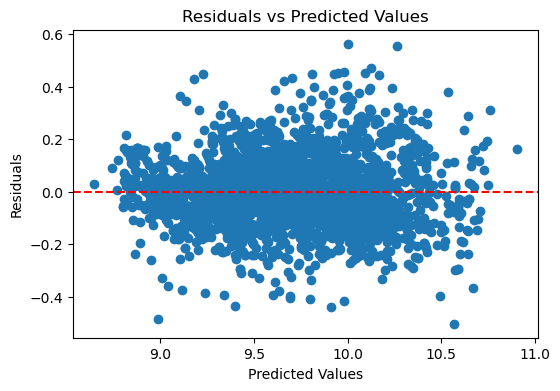

In [129]:
# Linearity check: Plot residuals vs fitted values

residuals = y_test - y_pred
plt.figure(figsize=(6,4))

plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='red', linestyle='--')

plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs Predicted Values")

plt.show()

Check normality in residual distribution

<Axes: xlabel='price_log', ylabel='Count'>

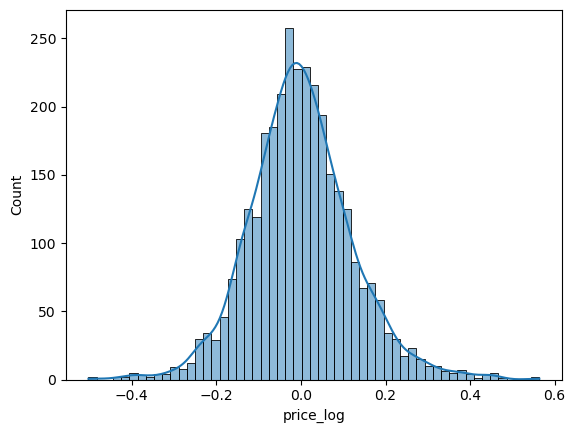

In [131]:
# Check the normality of residuals by plotting their distribution
sns.histplot(residuals, kde=True)


Check multicollinearity using Variance Inflation Factor (VIF) and handle features with high VIF.

In [133]:
# Check for multicollinearity and handle
from statsmodels.stats.outliers_influence import variance_inflation_factor



X_vif = pd.DataFrame(X_train, columns=X.columns)

vif_data = pd.DataFrame()
vif_data["Feature"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) 
                   for i in range(X_vif.shape[1])]


vif_data = vif_data.sort_values(by="VIF", ascending=False)

print(vif_data)


/opt/anaconda3/lib/python3.12/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


                              Feature         VIF
12                          num_media         inf
9                          num_extras         inf
15                     total_features         inf
11                        num_comfort         inf
10                         num_safety         inf
4                               hp_kW  276.920693
13                       power_per_cc  187.633574
6                     Displacement_cc  180.231230
29                  Drive_chain_front   63.542946
0                                  km   32.669283
14                        km_per_year   27.797640
7                           Weight_kg   21.465915
20                 vat_VAT deductible   19.797010
8                           cons_comb   16.874936
2                                 age   12.674641
3                     Previous_Owners   12.149679
22                        Fuel_Diesel   10.161058
1                               Gears    7.665008
21                          Type_Used    6.705763


In [135]:
X_train = X_train.drop('total_features', axis=1)
X_test = X_test.drop('total_features', axis=1)

In [137]:
cols_to_drop = ['power_per_cc', 'Displacement_cc']

X_train = X_train.drop(cols_to_drop, axis=1)
X_test = X_test.drop(cols_to_drop, axis=1)

In [139]:
X_train = X_train.drop('km', axis=1)
X_test = X_test.drop('km', axis=1)

### **3.2 Ridge Regression Implementation** <font color =red> [10 marks] </font>

#### **3.2.1** <font color =red> [2 marks] </font>
Define a list of random alpha values

In [141]:
# List of alphas to tune for Ridge regularisation
from sklearn.linear_model import Ridge
alphas = [0.01, 0.1, 1, 10, 50, 100,150, 200]


#### **3.2.2** <font color =red> [4 marks] </font>
Apply Ridge Regularisation and find the best value of alpha from the list

In [149]:
# Applying Ridge regression
from sklearn.metrics import mean_squared_error, r2_score

ridge_results = {}

for alpha in alphas:
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train, y_train)
    
    y_pred_ridge = ridge.predict(X_test)
    y_train_pred = ridge.predict(X_train)
    
    mse = mean_squared_error(y_test, y_pred_ridge)
    r2 = r2_score(y_test, y_pred_ridge)
    r2_train=r2_score(y_train,y_train_pred)
    
    ridge_results[alpha] = {'MSE': mse, 'R2': r2,}

for alpha, result in ridge_results.items():
    print(f"Alpha: {alpha} → MSE: {result['MSE']:.4f}, R2: {result['R2']:.4f}")


Alpha: 0.01 → MSE: 0.0157, R2: 0.9016
Alpha: 0.1 → MSE: 0.0157, R2: 0.9016
Alpha: 1 → MSE: 0.0157, R2: 0.9015
Alpha: 10 → MSE: 0.0159, R2: 0.9005
Alpha: 50 → MSE: 0.0170, R2: 0.8936
Alpha: 100 → MSE: 0.0183, R2: 0.8854
Alpha: 150 → MSE: 0.0196, R2: 0.8774
Alpha: 200 → MSE: 0.0209, R2: 0.8694


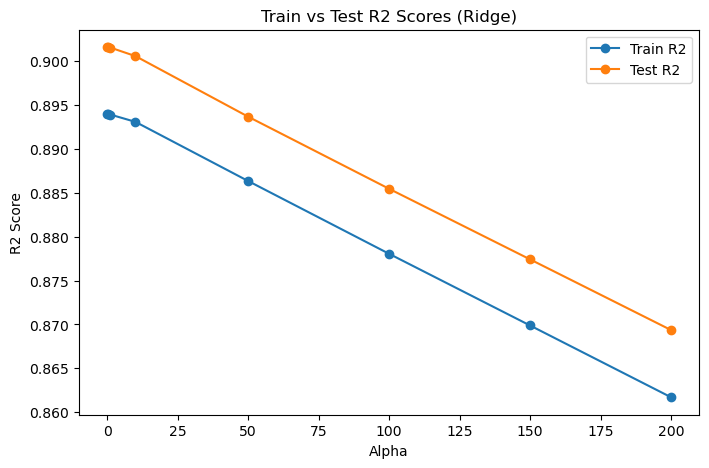

In [151]:
# Plot train and test scores against alpha

from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score

alphas = [0.01, 0.1, 1, 10, 50, 100, 150, 200]

train_scores = []
test_scores = []

for alpha in alphas:
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = ridge.predict(X_train)
    y_test_pred = ridge.predict(X_test)
    
    # R2 scores
    train_scores.append(r2_score(y_train, y_train_pred))
    test_scores.append(r2_score(y_test, y_test_pred))




plt.figure(figsize=(8,5))

plt.plot(alphas, train_scores, marker='o', label='Train R2')
plt.plot(alphas, test_scores, marker='o', label='Test R2')

plt.xlabel("Alpha")
plt.ylabel("R2 Score")
plt.title("Train vs Test R2 Scores (Ridge)")
plt.legend()

plt.show()

Find the best alpha value.

In [155]:
# Best alpha value

from sklearn.model_selection import GridSearchCV

# Best score (negative MAE)
alphas = [0.01, 0.1, 1, 10, 50, 100]

ridge = Ridge()

grid = GridSearchCV(
    ridge,
    param_grid={'alpha': alphas},
    scoring='neg_mean_absolute_error',
    cv=5
)

grid.fit(X_train, y_train)



GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.01, 0.1, 1, 10, 50, 100]},
             scoring='neg_mean_absolute_error')

In [157]:
print("Best Alpha:", grid.best_params_['alpha'])
print("Best Score (neg MAE):", grid.best_score_)

Best Alpha: 1
Best Score (neg MAE): -0.09757870966084561


We will get some best value of alpha above. This however is not the most accurate value but the best value from the given list. Now we have a rough estimate of the range that best alpha falls in. Let us do another iteration over the values in a smaller range.

#### **3.2.3** <font color =red> [4 marks] </font>
Fine tune by taking a closer range of alpha based on the previous result.

In [159]:
# Take a smaller range of alpha to test

alphas_fine = [0.5, 0.7, 0.9, 1, 1.1, 1.3, 1.5, 2]

In [161]:
# Applying Ridge regression
ridge = Ridge()

grid_fine = GridSearchCV(
    ridge,
    param_grid={'alpha': alphas_fine},
    scoring='neg_mean_absolute_error',
    cv=5
)

grid_fine.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.5, 0.7, 0.9, 1, 1.1, 1.3, 1.5, 2]},
             scoring='neg_mean_absolute_error')

In [163]:
print("Fine-tuned Alpha:", grid_fine.best_params_['alpha'])
print("Best Score (neg MAE):", grid_fine.best_score_)

# Convert to MAE
print("Best MAE:", -grid_fine.best_score_)

Fine-tuned Alpha: 2
Best Score (neg MAE): -0.09756987942287251
Best MAE: 0.09756987942287251


Plot the error-alpha graph again and find the actual optimal value for alpha.

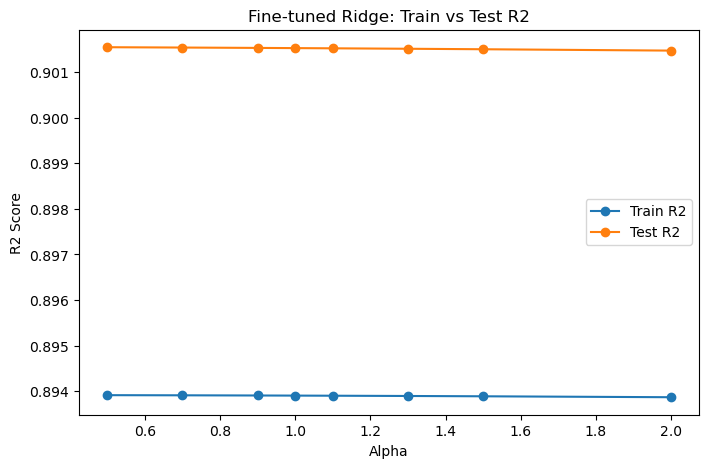

In [165]:
# Plot train and test scores against alpha



# Best alpha value



# Best score (negative MAE)


alphas_fine = [0.5, 0.7, 0.9, 1, 1.1, 1.3, 1.5, 2]

train_scores = []
test_scores = []

for alpha in alphas_fine:
    model = Ridge(alpha=alpha)
    model.fit(X_train, y_train)
    
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    train_scores.append(r2_score(y_train, y_train_pred))
    test_scores.append(r2_score(y_test, y_test_pred))

plt.figure(figsize=(8,5))
plt.plot(alphas_fine, train_scores, marker='o', label='Train R2')
plt.plot(alphas_fine, test_scores, marker='o', label='Test R2')

plt.xlabel("Alpha")
plt.ylabel("R2 Score")
plt.title("Fine-tuned Ridge: Train vs Test R2")
plt.legend()
plt.show()



In [167]:
# Set best alpha for Ridge regression
# Fit the Ridge model to get the coefficients of the fitted model
best_alpha=2
ridge_final = Ridge(alpha=best_alpha)

ridge_final.fit(X_train, y_train)


Ridge(alpha=2)

In [171]:
# Show the coefficients for each feature

coefficients = ridge_final.coef_


import pandas as pd

coef_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': coefficients
})

coef_df = coef_df.sort_values(by='Coefficient', key=abs, ascending=False)

print(coef_df)

                              Feature  Coefficient
11                        km_per_year    -0.900315
3                               hp_kW     0.741986
9                         num_comfort     0.383119
5                           Weight_kg     0.359497
1                                 age    -0.344912
27                      brand_Renault    -0.332511
26                         brand_Opel    -0.313874
15                      body_type_Van     0.243604
24        Gearing_Type_Semi-automatic     0.114464
0                               Gears     0.106833
10                          num_media    -0.092423
23                Gearing_Type_Manual    -0.085267
20                   Paint_Type_Other     0.054411
22  Upholstery_type_Part/Full Leather     0.047966
8                          num_safety    -0.043016
18                        Fuel_Diesel     0.036932
14            body_type_Station wagon     0.025922
12                    body_type_Other     0.020770
19                         Fuel

In [173]:
# Evaluate the Ridge model on the test data

y_test_pred = ridge_final.predict(X_test)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_test_pred)

print("Test MSE:", mse)
print("Test RMSE:", rmse)
print("Test R2:", r2)

Test MSE: 0.015748321190952833
Test RMSE: 0.1254923152665247
Test R2: 0.901475432760944


### **3.3 Lasso Regression Implementation** <font color =red> [10 marks] </font>

#### **3.3.1** <font color =red> [2 marks] </font>
Define a list of random alpha values

In [177]:
# List of alphas to tune for Lasso regularisation
from sklearn.linear_model import Lasso
alphas = [0.0001, 0.001, 0.01, 0.1, 1]


#### **3.3.2** <font color =red> [4 marks] </font>
Apply Ridge Regularisation and find the best value of alpha from the list

In [179]:
# Initialise Lasso regression model
lasso_results = {}

for alpha in alphas:
    lasso = Lasso(alpha=alpha, max_iter=10000)
    lasso.fit(X_train, y_train)
    
    y_pred_lasso = lasso.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred_lasso)
    r2 = r2_score(y_test, y_pred_lasso)
    
    lasso_results[alpha] = {'MSE': mse, 'R2': r2}

# Print results
for alpha, result in lasso_results.items():
    print(f"Alpha: {alpha} → MSE: {result['MSE']:.4f}, R2: {result['R2']:.4f}")



Alpha: 0.0001 → MSE: 0.0157, R2: 0.9015
Alpha: 0.001 → MSE: 0.0163, R2: 0.8978
Alpha: 0.01 → MSE: 0.0297, R2: 0.8139
Alpha: 0.1 → MSE: 0.1599, R2: -0.0006
Alpha: 1 → MSE: 0.1599, R2: -0.0006


In [181]:
best_alpha_lasso = min(lasso_results, key=lambda x: lasso_results[x]['MSE'])

print("Best Alpha (Lasso):", best_alpha_lasso)
print("Best Result:", lasso_results[best_alpha_lasso])

Best Alpha (Lasso): 0.0001
Best Result: {'MSE': 0.015748668350585072, 'R2': 0.9014732608626118}


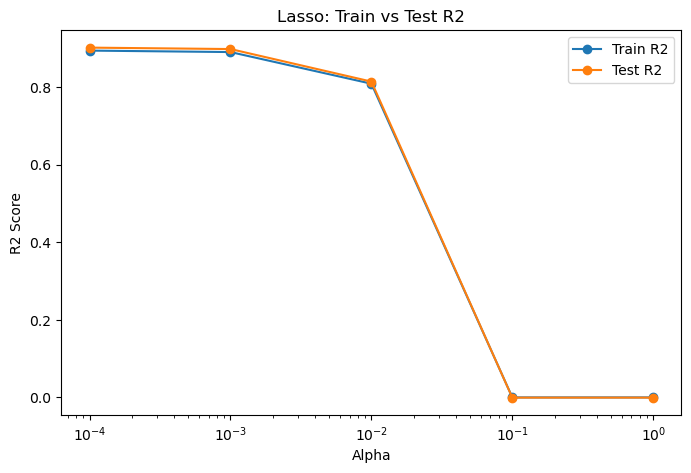

In [183]:
# Plot train and test scores against alpha
alphas = [0.0001, 0.001, 0.01, 0.1, 1]

train_scores = []
test_scores = []

for alpha in alphas:
    lasso = Lasso(alpha=alpha, max_iter=10000)
    lasso.fit(X_train, y_train)
    
    y_train_pred = lasso.predict(X_train)
    y_test_pred = lasso.predict(X_test)
    
    train_scores.append(r2_score(y_train, y_train_pred))
    test_scores.append(r2_score(y_test, y_test_pred))


plt.figure(figsize=(8,5))

plt.plot(alphas, train_scores, marker='o', label='Train R2')
plt.plot(alphas, test_scores, marker='o', label='Test R2')

plt.xlabel("Alpha")
plt.ylabel("R2 Score")
plt.title("Lasso: Train vs Test R2")
plt.legend()

plt.xscale('log')  
plt.show()


In [185]:
# Best alpha value


# Best score (negative MAE)


alphas = [0.0001, 0.001, 0.01, 0.1, 1]

lasso = Lasso(max_iter=10000)

grid_lasso = GridSearchCV(
    lasso,
    param_grid={'alpha': alphas},
    scoring='neg_mean_absolute_error',
    cv=5
)

grid_lasso.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=Lasso(max_iter=10000),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 1]},
             scoring='neg_mean_absolute_error')

In [187]:
print("Best Alpha:", grid_lasso.best_params_['alpha'])
print("Best Score (neg MAE):", grid_lasso.best_score_)

Best Alpha: 0.0001
Best Score (neg MAE): -0.09761606143198633


#### **3.3.3** <font color =red> [4 marks] </font>
Fine tune by taking a closer range of alpha based on the previous result.

In [191]:
# List of alphas to tune for Lasso regularization
alphas_fine = [0.00001, 0.00005, 0.0001, 0.0002, 0.0005,0.0006,0.0008]


In [193]:
# Tuning Lasso hyperparameters
lasso = Lasso(max_iter=10000)

grid_fine = GridSearchCV(
    lasso,
    param_grid={'alpha': alphas_fine},
    scoring='neg_mean_absolute_error',
    cv=5
)

grid_fine.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=Lasso(max_iter=10000),
             param_grid={'alpha': [1e-05, 5e-05, 0.0001, 0.0002, 0.0005, 0.0006,
                                   0.0008]},
             scoring='neg_mean_absolute_error')

In [195]:
print("Fine-tuned Alpha:", grid_fine.best_params_['alpha'])
print("Best Score (neg MAE):", grid_fine.best_score_)
print("Best MAE:", -grid_fine.best_score_)

Fine-tuned Alpha: 0.0002
Best Score (neg MAE): -0.09758378906521523
Best MAE: 0.09758378906521523


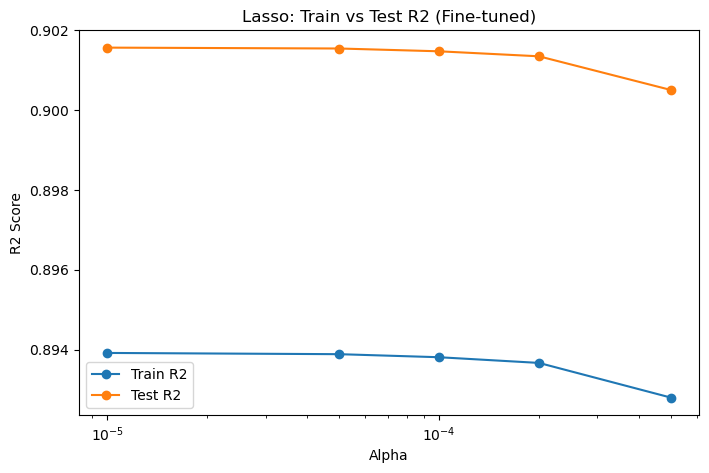

In [199]:
# Plot train and test scores against alpha

alphas_fine = [0.00001, 0.00005, 0.0001, 0.0002, 0.0005]

train_scores = []
test_scores = []

for alpha in alphas_fine:
    model = Lasso(alpha=alpha, max_iter=10000)
    model.fit(X_train, y_train)
    
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    train_scores.append(r2_score(y_train, y_train_pred))
    test_scores.append(r2_score(y_test, y_test_pred))

plt.figure(figsize=(8,5))

plt.plot(alphas_fine, train_scores, marker='o', label='Train R2')
plt.plot(alphas_fine, test_scores, marker='o', label='Test R2')

plt.xlabel("Alpha")
plt.ylabel("R2 Score")
plt.title("Lasso: Train vs Test R2 (Fine-tuned)")
plt.legend()

plt.xscale('log')  # very important for small alphas

plt.show()

# Best alpha value


# Best score (negative MAE)
Fine-tuned Alpha: 0.0002
Best Score (neg MAE): -0.09758378906521523
Best MAE: 0.09758378906521523



In [201]:
# Set best alpha for Lasso regression


# Fit the Lasso model on scaled training data
# Get the coefficients of the fitted model
best_alpha_lasso=0.0002
lasso_final = Lasso(alpha=best_alpha_lasso, max_iter=10000)
lasso_final.fit(X_train, y_train)


Lasso(alpha=0.0002, max_iter=10000)

In [203]:
# Check the coefficients for each feature

coef_df_lasso = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': lasso_final.coef_
})


coef_df_lasso = coef_df_lasso.sort_values(by='Coefficient', key=abs, ascending=False)

print(coef_df_lasso)


                              Feature  Coefficient
11                        km_per_year    -0.884529
3                               hp_kW     0.749357
9                         num_comfort     0.364582
5                           Weight_kg     0.357760
1                                 age    -0.346687
27                      brand_Renault    -0.328209
26                         brand_Opel    -0.312604
15                      body_type_Van     0.233623
24        Gearing_Type_Semi-automatic     0.108093
0                               Gears     0.106494
10                          num_media    -0.088232
23                Gearing_Type_Manual    -0.085313
22  Upholstery_type_Part/Full Leather     0.047501
18                        Fuel_Diesel     0.036640
8                          num_safety    -0.034978
14            body_type_Station wagon     0.020429
13                   body_type_Sedans     0.011254
7                          num_extras    -0.011251
17                          Typ

In [207]:
# Evaluate the Lasso model on the test data
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

y_test_pred_lasso = lasso_final.predict(X_test)
mse = mean_squared_error(y_test, y_test_pred_lasso)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred_lasso)
r2 = r2_score(y_test, y_test_pred_lasso)

print("Lasso Test MSE:", mse)
print("Lasso Test RMSE:", rmse)
print("Lasso Test MAE:", mae)
print("Lasso Test R2:", r2)


Lasso Test MSE: 0.015768679844438832
Lasso Test RMSE: 0.12557340420821134
Lasso Test MAE: 0.09583934132511981
Lasso Test R2: 0.9013480650561609


### **3.4 Regularisation Comparison & Analysis** <font color =red> [5 marks] </font>

#### **3.4.1** <font color =red> [2 marks] </font>
Compare the evaluation metrics for each model.

In [209]:
# Compare metrics for each model
# Import libraries


# Initialize models
lr = LinearRegression()
ridge = Ridge(alpha=2)
lasso = Lasso(alpha=0.0002, max_iter=10000)


lr.fit(X_train, y_train)
ridge.fit(X_train, y_train)
lasso.fit(X_train, y_train)


y_pred_lr = lr.predict(X_test)
y_pred_ridge = ridge.predict(X_test)
y_pred_lasso = lasso.predict(X_test)


def evaluate(y_true, y_pred):
    return [
        mean_squared_error(y_true, y_pred),
        np.sqrt(mean_squared_error(y_true, y_pred)),
        mean_absolute_error(y_true, y_pred),
        r2_score(y_true, y_pred)
    ]

# Create results DataFrame
results = pd.DataFrame(
    [
        evaluate(y_test, y_pred_lr),
        evaluate(y_test, y_pred_ridge),
        evaluate(y_test, y_pred_lasso)
    ],
    columns=["MSE", "RMSE", "MAE", "R2"],
    index=["Linear Regression", "Ridge Regression", "Lasso Regression"]
)


print(results)

print("\nBest Model (lowest MAE):", results["MAE"].idxmin())


                        MSE      RMSE       MAE        R2
Linear Regression  0.015734  0.125436  0.095758  0.901563
Ridge Regression   0.015748  0.125492  0.095812  0.901475
Lasso Regression   0.015769  0.125573  0.095839  0.901348

Best Model (lowest MAE): Linear Regression


#### **3.4.2** <font color =red> [3 marks] </font>
Compare the coefficients for the three models.

Also visualise a few of the largest coefficients and the coefficients of features dropped by Lasso.

In [217]:
# Compare highest coefficients and coefficients of eliminated features

coef_comparison = pd.DataFrame({
    "Feature": X_train.columns,
    "Linear": lr.coef_,
    "Ridge": ridge.coef_,
    "Lasso": lasso.coef_
})


coef_comparison = coef_comparison.sort_values(
    by="Linear", key=abs, ascending=False
)


print(coef_comparison)

                              Feature    Linear     Ridge     Lasso
11                        km_per_year -0.948968 -0.900315 -0.884529
3                               hp_kW  0.747831  0.741986  0.749357
9                         num_comfort  0.385814  0.383119  0.364582
5                           Weight_kg  0.362208  0.359497  0.357760
1                                 age -0.339942 -0.344912 -0.346687
27                      brand_Renault -0.333538 -0.332511 -0.328209
26                         brand_Opel -0.313983 -0.313874 -0.312604
15                      body_type_Van  0.242553  0.243604  0.233623
24        Gearing_Type_Semi-automatic  0.114782  0.114464  0.108093
0                               Gears  0.104039  0.106833  0.106494
10                          num_media -0.092206 -0.092423 -0.088232
23                Gearing_Type_Manual -0.084924 -0.085267 -0.085313
20                   Paint_Type_Other  0.059857  0.054411  0.000000
22  Upholstery_type_Part/Full Leather  0.047288 

In [219]:


#
coef_df = pd.DataFrame({
    "Feature": X_train.columns,
    "Linear": lr.coef_,
    "Ridge": ridge.coef_,
    "Lasso": lasso.coef_
})


coef_df["Importance"] = coef_df["Linear"].abs()


coef_df = coef_df.sort_values(by="Importance", ascending=False)


top_features = coef_df.head(10)

print("Top Important Features:\n")
print(top_features[["Feature", "Linear", "Ridge", "Lasso"]])


eliminated_features = coef_df[coef_df["Lasso"] == 0]

print("\nFeatures Eliminated by Lasso:\n")
print(eliminated_features[["Feature", "Linear", "Ridge", "Lasso"]])

Top Important Features:

                        Feature    Linear     Ridge     Lasso
11                  km_per_year -0.948968 -0.900315 -0.884529
3                         hp_kW  0.747831  0.741986  0.749357
9                   num_comfort  0.385814  0.383119  0.364582
5                     Weight_kg  0.362208  0.359497  0.357760
1                           age -0.339942 -0.344912 -0.346687
27                brand_Renault -0.333538 -0.332511 -0.328209
26                   brand_Opel -0.313983 -0.313874 -0.312604
15                body_type_Van  0.242553  0.243604  0.233623
24  Gearing_Type_Semi-automatic  0.114782  0.114464  0.108093
0                         Gears  0.104039  0.106833  0.106494

Features Eliminated by Lasso:

                 Feature    Linear     Ridge  Lasso
20      Paint_Type_Other  0.059857  0.054411    0.0
19            Fuel_Other  0.020730  0.017390    0.0
12       body_type_Other  0.020136  0.020770    0.0
2        Previous_Owners -0.010005 -0.007816   -0.0
2

## **4 Conclusion & Key Takeaways**  <font color =red> [10 marks] </font>

What did you notice by performing regularisation? Did the model performance improve? If not, then why? Did you find overfitting or not? Was the data sufficent? Is a linear model sufficient?

Conclusion
-Regularisation (Ridge and Lasso) was applied to reduce overfitting and handle multicollinearity. It shrinks model coefficients and improves stability.Model performance didnt improve very much because No major overfitting was observed and data was processed well and linear model achieved great performance with  low mse Train and test scores were very close
Residual plots showed no major issues.Yes, the dataset was sufficient: model had enough data to learn patterns.

#### **4.1 Conclude with outcomes and insights gained** <font color =red> [10 marks] </font>